https://github.com/ultralytics/ultralytics/issues/2066

In [1]:
#!pip install ultralytics==8.0.28
!pip install ultralytics

!pip install gdown 

from IPython import display
display.clear_output()

In [1]:

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.112 🚀 Python-3.10.11 torch-2.0.0 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Setup complete ✅ (8 CPUs, 59.9 GB RAM, 36.4/193.8 GB disk)


In [2]:
!nvidia-smi

Sat Jun  3 23:04:37 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  On   | 00000000:00:1E.0 Off |                    0 |
| N/A   44C    P0    27W / 300W |      2MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
! pip install -q kaggle

! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json


mkdir: cannot create directory ‘/home/ubuntu/.kaggle’: File exists
cp: cannot stat 'kaggle.json': No such file or directory


In [5]:
import zipfile
import os

# if os.path.isdir("BUU-LSPINE (Vertebral position)") == False :
#    print("Downloading...")
#    !kaggle competitions download -c lumbar

# zip_output = "lumbar.zip"


# with zipfile.ZipFile(zip_output, 'r') as zip_ref:
#            zip_ref.extractall('.')

In [3]:
import os
import pandas as pd
import numpy as np
import random

def create_label_dataframe(image_files):
    labels = []
    csvs   = []
    for file_path in image_files:
        # Assuming the folder containing the image file is the label
        label = os.path.basename(os.path.dirname(file_path))
        csv_file = file_path.replace('.jpg','.csv')
        labels.append(label)
        csvs.append(csv_file)

    data = {'img_Path': image_files , 'Label': labels}
    df = pd.DataFrame(data)
    return df

def find_image_files(folder_path):
    image_files = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')):
                image_files.append(os.path.join(root, file))
    return image_files


folder_path = "BUU-LSPINE (Vertebral position)/train"  # Replace with the actual folder path


image_files = find_image_files(folder_path)
df = create_label_dataframe(image_files)
df['index'] = df['Label'].map({'LA':0,'LA':1})



df =df[df['Label']=='LA']

df

,img_Path,Label,index
0,BUU-LSPINE (Vertebral position)/train/LA/193_L...,LA,1.0
1,BUU-LSPINE (Vertebral position)/train/LA/263_L...,LA,1.0
2,BUU-LSPINE (Vertebral position)/train/LA/369_L...,LA,1.0
3,BUU-LSPINE (Vertebral position)/train/LA/97_LA...,LA,1.0
4,BUU-LSPINE (Vertebral position)/train/LA/244_L...,LA,1.0
...,...,...,...
395,BUU-LSPINE (Vertebral position)/train/LA/107_L...,LA,1.0
396,BUU-LSPINE (Vertebral position)/train/LA/159_L...,LA,1.0
397,BUU-LSPINE (Vertebral position)/train/LA/46_LA...,LA,1.0
398,BUU-LSPINE (Vertebral position)/train/LA/267_L...,LA,1.0


In [5]:

img_file = random.choice(df['img_Path'].tolist())

csv_file = img_file.replace('.jpg','.csv')

data = np.loadtxt(csv_file, delimiter=',', dtype=np.float32)


data.shape

(11, 5)

In [6]:

def ReadAllBox_csv(img_file):

    csv_file = img_file.replace('.jpg','.csv')

    data = np.loadtxt(csv_file, delimiter=',', dtype=np.float32)

    D   = []
    Cls = []
    for i in range(0,10,2) :
       
        d = np.array(data[i,:-1].tolist()+ data[i+1,2:4].tolist() + data[i+1,0:2].tolist() )
        cls =i/2
        Cls.append(cls)
        D.append(d)
    
    i= 9
    d = np.array(data[i,:-1].tolist()+ data[10,2:4].tolist() + data[10,0:2].tolist() )
    D.append(d)
    

    return np.array(D)


img_file = random.choice(df['img_Path'].tolist())
D        =  ReadAllBox_csv(img_file)

D.shape

(6, 8)

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2


def draw_line_Up(image_cv, Line , color, thickness):

    Hight,Weight      = image_cv.shape[:2]
    x0, y0, x1, y1    = Line 
    x0,y0,x1,y1       = x0*Weight,y0*Hight,x1*Weight,y1*Hight

    # Draw a line using OpenCV
    start_point = (int(x0), int(y0))
    end_point = (int(x1), int(y1))
    cv2.line(image_cv, start_point, end_point, color, thickness)
    return image_cv

def draw_line_Down(image_cv, Line , color, thickness):

    Hight,Weight      = image_cv.shape[:2]
    x1, y1, x0, y0    = Line 
    x0,y0,x1,y1       = x0*Weight,y0*Hight,x1*Weight,y1*Hight

    # Draw a line using OpenCV
    start_point = (int(x0), int(y0))
    end_point = (int(x1), int(y1))
    cv2.line(image_cv, start_point, end_point, color, thickness)
    return image_cv


def  draw_box(image_cv, D , color, thickness):
   
    draw_line_Up(image_cv,D[0:4], color, thickness)
    draw_line_Down(image_cv,D[4:], color, thickness)
   
    return image_cv





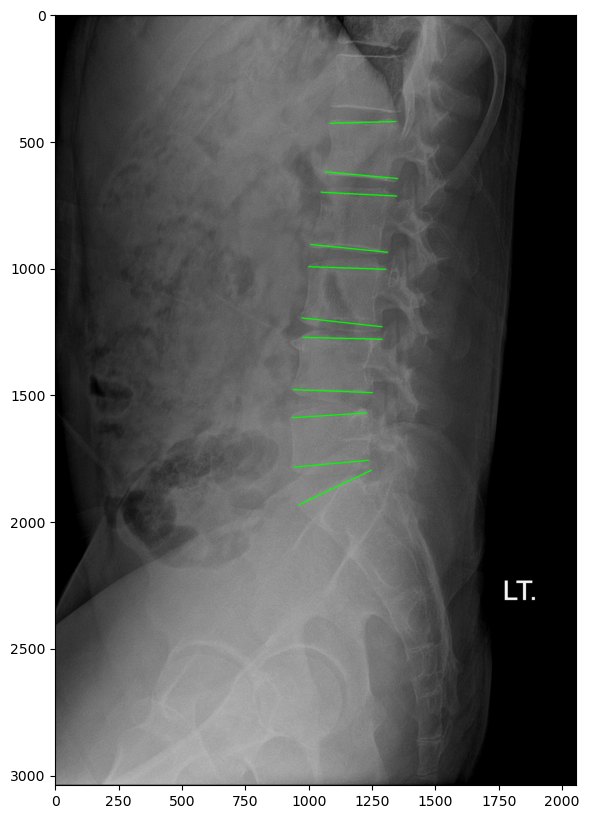

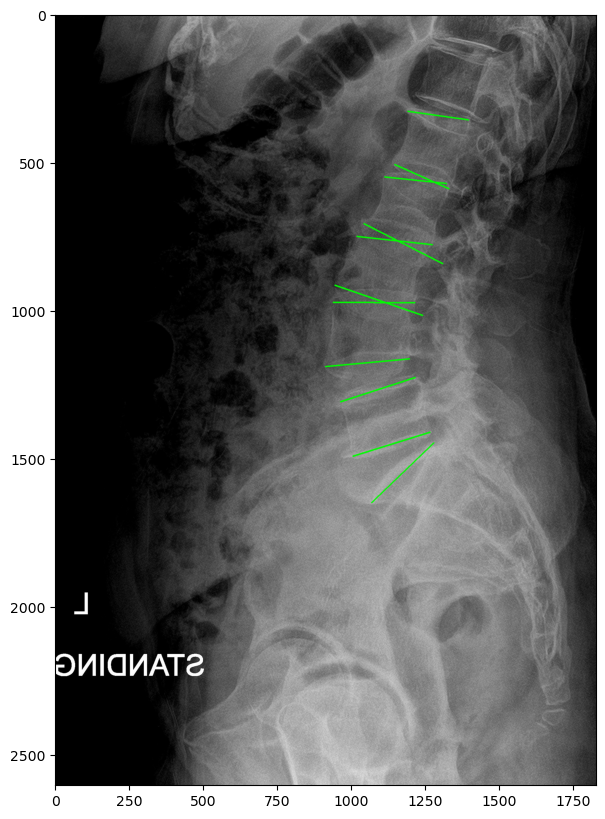

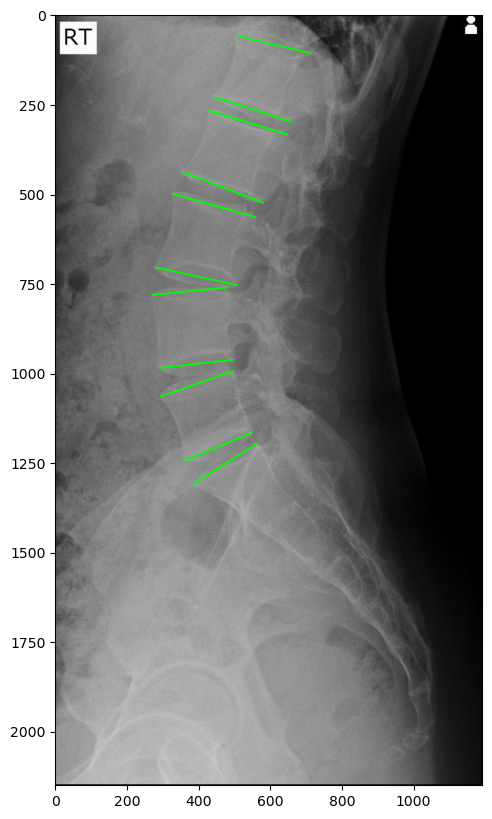

In [9]:
import random

for j in range(3) :

    img_file = random.choice(df['img_Path'].tolist())
    image_cv          = cv2.imread(img_file)
    D                 =  ReadAllBox_csv(img_file)

    for i in range(6) :
      image = draw_box(image_cv, D[i] , (0,255,0), 3)

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

In [10]:
def create_txt_yolo(savepath,img_file):
     
     output_file = savepath +"/" + os.path.basename(img_file).replace('.jpg','.txt') 
     D = ReadAllBox_csv(img_file)
     with open(output_file, 'w') as f:
        for cls in range(len(D)):
            if cls == len(D)-1:
              line = f'{1}'  
            else :    
              line = f'{0}'
            
            for j in range(8):
                line += f' {D[cls][j]:.18f}'
            line += '\n'    

            f.write(line)


df0 =df.iloc[0:2]

Z = df0['img_Path'].apply(lambda x: create_txt_yolo('.',x))

In [11]:
df

,img_Path,Label,index
0,BUU-LSPINE (Vertebral position)/train/LA/193_L...,LA,1.0
1,BUU-LSPINE (Vertebral position)/train/LA/263_L...,LA,1.0
2,BUU-LSPINE (Vertebral position)/train/LA/369_L...,LA,1.0
3,BUU-LSPINE (Vertebral position)/train/LA/97_LA...,LA,1.0
4,BUU-LSPINE (Vertebral position)/train/LA/244_L...,LA,1.0
...,...,...,...
395,BUU-LSPINE (Vertebral position)/train/LA/107_L...,LA,1.0
396,BUU-LSPINE (Vertebral position)/train/LA/159_L...,LA,1.0
397,BUU-LSPINE (Vertebral position)/train/LA/46_LA...,LA,1.0
398,BUU-LSPINE (Vertebral position)/train/LA/267_L...,LA,1.0


In [12]:
df0

,img_Path,Label,index
0,BUU-LSPINE (Vertebral position)/train/LA/193_L...,LA,1.0
1,BUU-LSPINE (Vertebral position)/train/LA/263_L...,LA,1.0


In [13]:
import shutil

mode = "train"

def Create_Yolo_Dataset(mode='train', df =df):

    if not os.path.exists("datasets"):
        os.mkdir("datasets")   
        
        
    mainfloder = f"./datasets/{mode}"
    main_image_floder = f"{mainfloder}/images"
    main_label_floder = f"{mainfloder}/labels"

    if not os.path.exists(mainfloder):
        os.mkdir(mainfloder)
    if not os.path.exists(main_image_floder):
        os.mkdir(main_image_floder)
    if not os.path.exists(main_label_floder):
        os.mkdir(main_label_floder)

    # copy image
    df['img_Path'].apply(lambda x: shutil.copy(x, main_image_floder+"/"+os.path.basename(x)))  

    # Copy label
    df['img_Path'].apply(lambda x: create_txt_yolo(main_label_floder,x))



if os.path.exists("datasets"):
     shutil.rmtree("datasets")

Create_Yolo_Dataset(mode='train', df =df)   
Create_Yolo_Dataset(mode='test', df =df)   

In [14]:
import yaml

data = {
    'train': './train/images', # Path to the directory containing training images
    'val': './test/images', # Path to the directory containing validation images
    'names': ['L','S']# List of class names
}

with open('dataset.yaml', 'w') as outfile:
    yaml.dump(data, outfile)

In [43]:
##### from ultralytics import YOLO
import torch


import multiprocessing

def get_cpu_core_count():
    return multiprocessing.cpu_count()


#model = YOLO("yolov8l-seg.pt")
model = YOLO('./runs/segment/Y2_20.5_6/weights/best.pt')


model_params = {
    'data': "dataset.yaml",
    'epochs': 25,
    'batch': 12,
    'imgsz': 720,
    'device': '0' if torch.cuda.is_available() else "cpu",
    'lr0':0.005,
    'lrf':0.005,
   
     'workers': 8,
     #'resume':True,

    'name': 'Y2_20.5_',
    'plots': True,
    'save': True,

    #'close_mosaic':5,
    'save_period':2,
    "hsv_h": 0.015, # image HSV-Hue augmentation (fraction)
    "hsv_s": 0.7, # image HSV-Saturation augmentation (fraction)
    "hsv_v": 0.4, # image HSV-Value augmentation (fraction)
    "degrees": 5, # image rotation (+/- deg)
    "translate": 0.35, # image translation (+/- fraction)
    "scale": 0.5, # image scale (+/- gain)
    "shear": 5, # image shear (+/- deg)
    "perspective": 0, # image perspective (+/- fraction), range 0-0.001
    "flipud": 0, # image flip up-down (probability)
    "fliplr": 0, # image flip left-right (probability)
    "mosaic": 0.3, # image mosaic (probability)
    "mixup": 0.25, # image mixup (probability)
    "copy_paste": 0, # segment copy-paste (probability),
    
    } 

model_params['workers'] = get_cpu_core_count() if model_params['device']=='0'  else 2
                      
       
model_params

{'data': 'dataset.yaml',
 'epochs': 25,
 'batch': 12,
 'imgsz': 720,
 'device': '0',
 'lr0': 0.005,
 'lrf': 0.005,
 'workers': 8,
 'name': 'Y2_20.5_',
 'plots': True,
 'save': True,
 'save_period': 2,
 'hsv_h': 0.015,
 'hsv_s': 0.7,
 'hsv_v': 0.4,
 'degrees': 5,
 'translate': 0.35,
 'scale': 0.5,
 'shear': 5,
 'perspective': 0,
 'flipud': 0,
 'fliplr': 0,
 'mosaic': 0.3,
 'mixup': 0.25,
 'copy_paste': 0}

In [44]:


results = model.train( **model_params)

Ultralytics YOLOv8.0.112 🚀 Python-3.10.11 torch-2.0.0 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
yolo/engine/trainer: task=segment, mode=train, model=./runs/segment/Y2_20.5_6/weights/best.pt, data=dataset.yaml, epochs=25, patience=50, batch=12, imgsz=720, save=True, save_period=2, cache=False, device=0, workers=8, project=None, name=Y2_20.5_, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=Fal

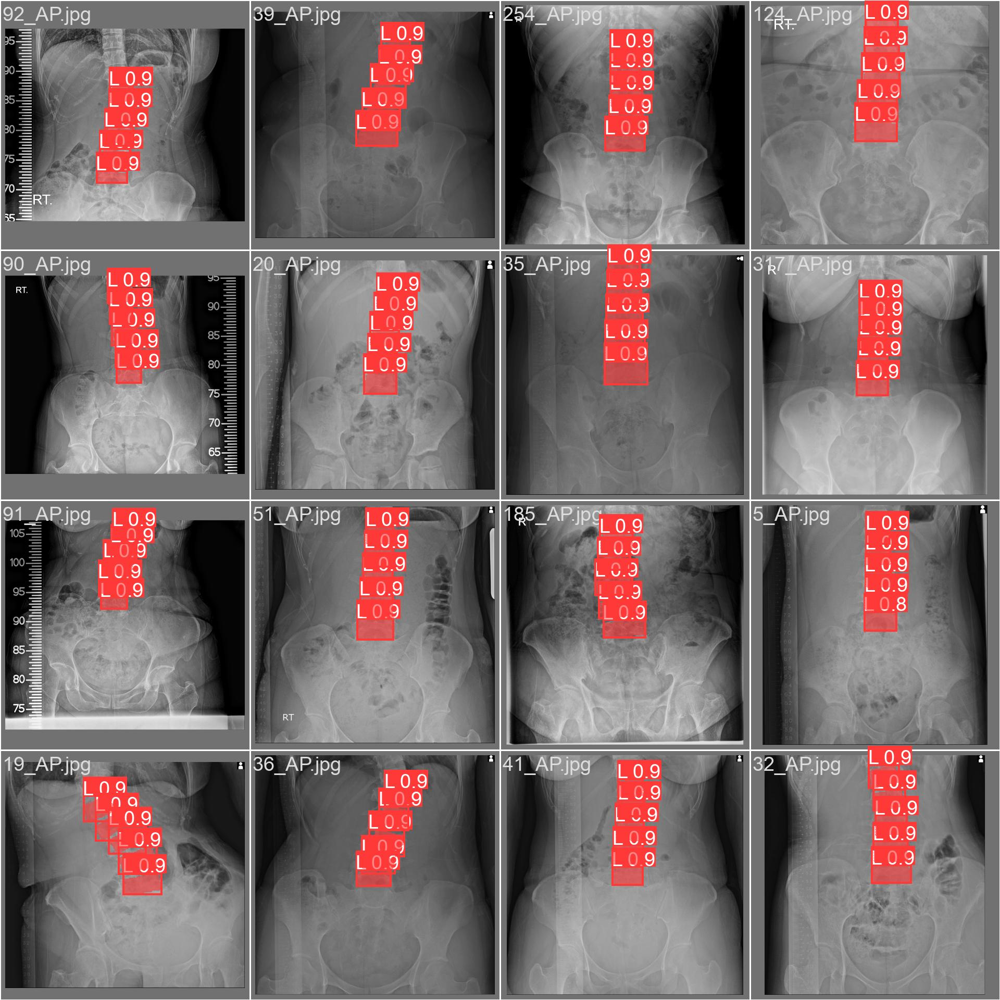

In [45]:
from IPython.display import display, Image
import os

Name_experiment = "Y2_20.5_7"

file_path = f'/content/runs/segment/{Name_experiment}/val_batch0_pred.jpg'
Image(filename=f'./runs/segment/{Name_experiment}/val_batch0_pred.jpg', width=1200)

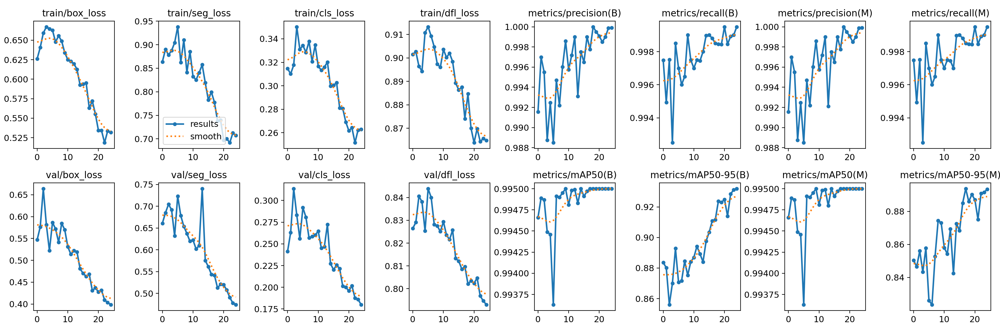

In [47]:
import os
from IPython.display import display, Image

file_path = f'./runs/segment/{Name_experiment}/results.png'

if os.path.exists(file_path):
    display(Image(filename=file_path, width=1200))
else:
    print("File does not exist")


In [48]:
def find_image_files(folder_path):
    image_files = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')):
                image_files.append(os.path.join(root, file))
    return image_files


path = "BUU-LSPINE (Vertebral position)/train/LA"

LAPfiles = find_image_files(path)


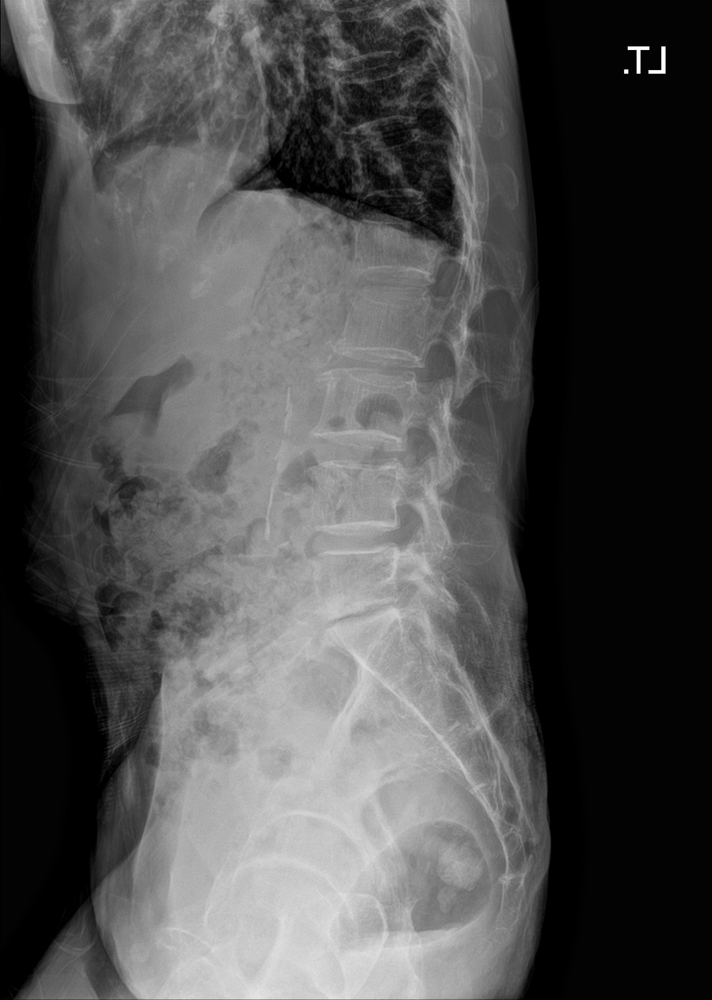

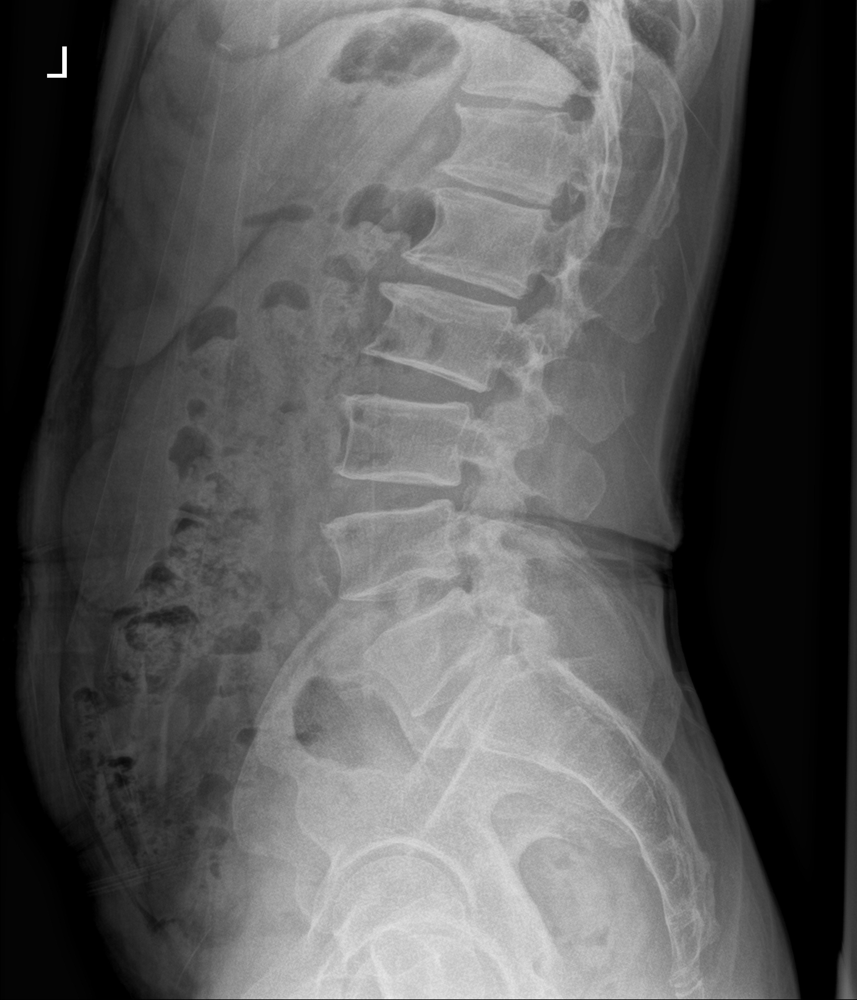

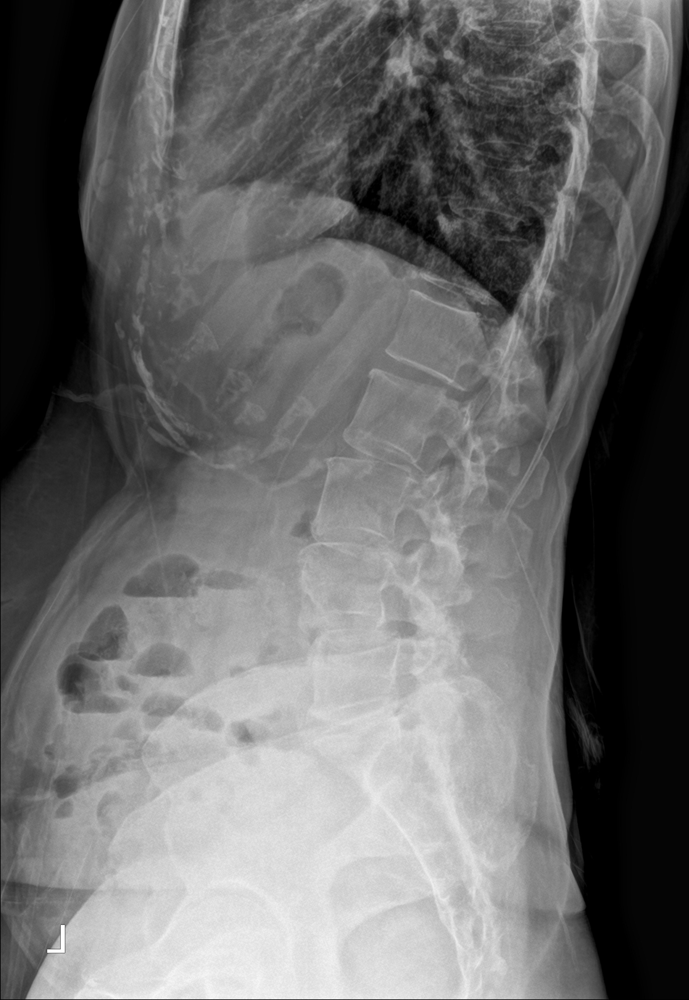

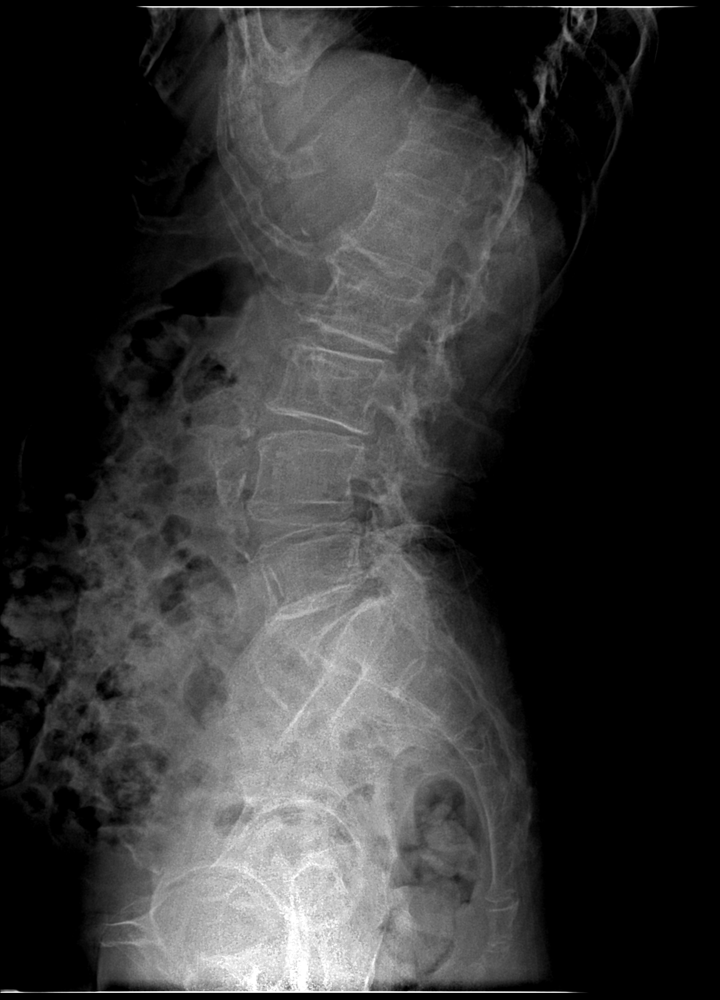

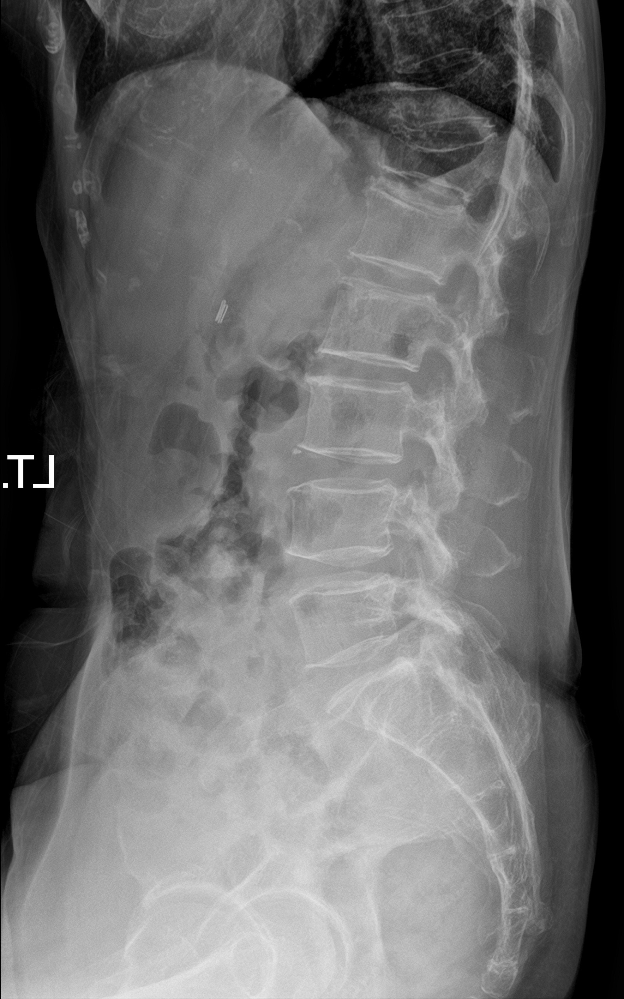

In [49]:
import glob
from IPython.display import Image, display

for image_path in LAPfiles[:5]:
      display(Image(filename=image_path, width=500))
      print("\n")

In [52]:
from ultralytics import YOLO
import numpy as np
import torch



model = YOLO('./runs/segment/Y2_20.5_7/weights/best.pt')
model


image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/train/LA/7_LA.jpg: 736x416 3 Ls, 18.3ms
Speed: 2.7ms preprocess, 18.3ms inference, 2.8ms postprocess per image at shape (1, 3, 736, 736)


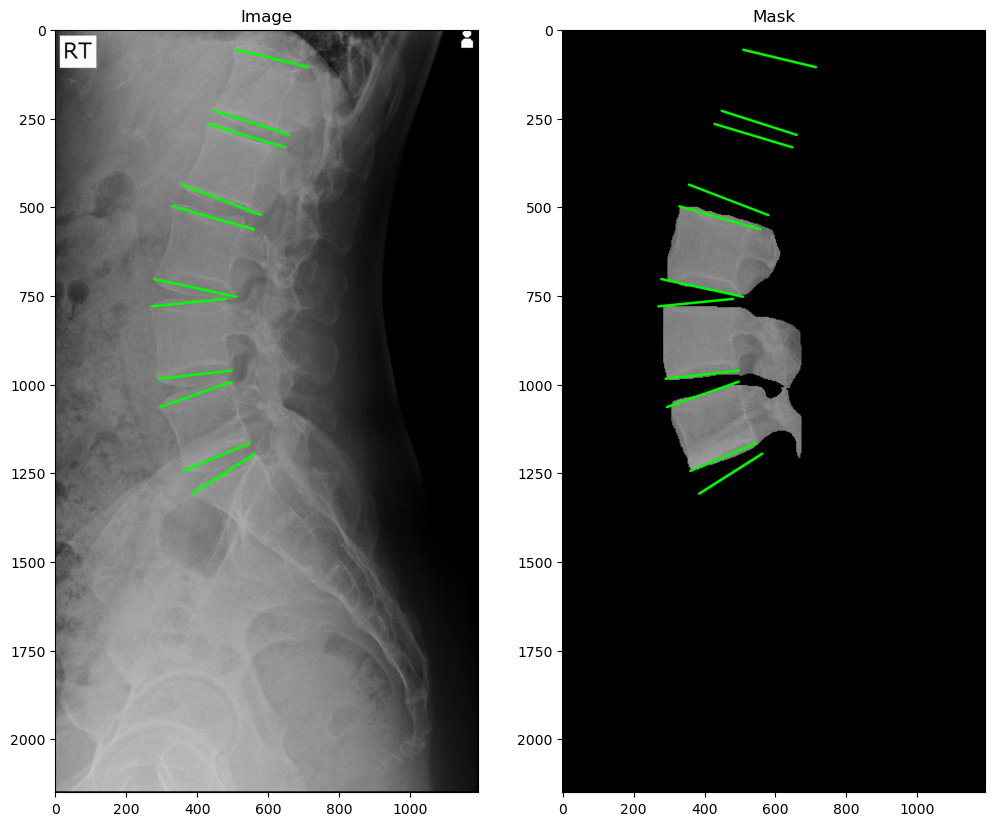


image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/train/LA/335_LA.jpg: 736x544 (no detections), 19.7ms
Speed: 3.9ms preprocess, 19.7ms inference, 0.4ms postprocess per image at shape (1, 3, 736, 736)

image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/train/LA/76_LA.jpg: 736x608 4 Ls, 21.2ms
Speed: 3.9ms preprocess, 21.2ms inference, 3.0ms postprocess per image at shape (1, 3, 736, 736)


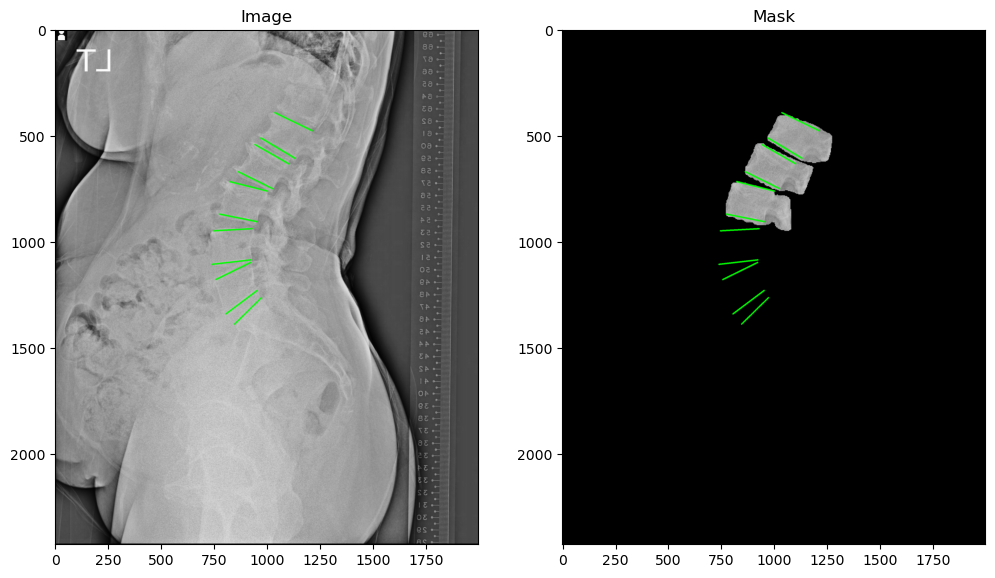


image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/train/LA/252_LA.jpg: 736x608 2 Ls, 20.7ms
Speed: 4.0ms preprocess, 20.7ms inference, 2.9ms postprocess per image at shape (1, 3, 736, 736)


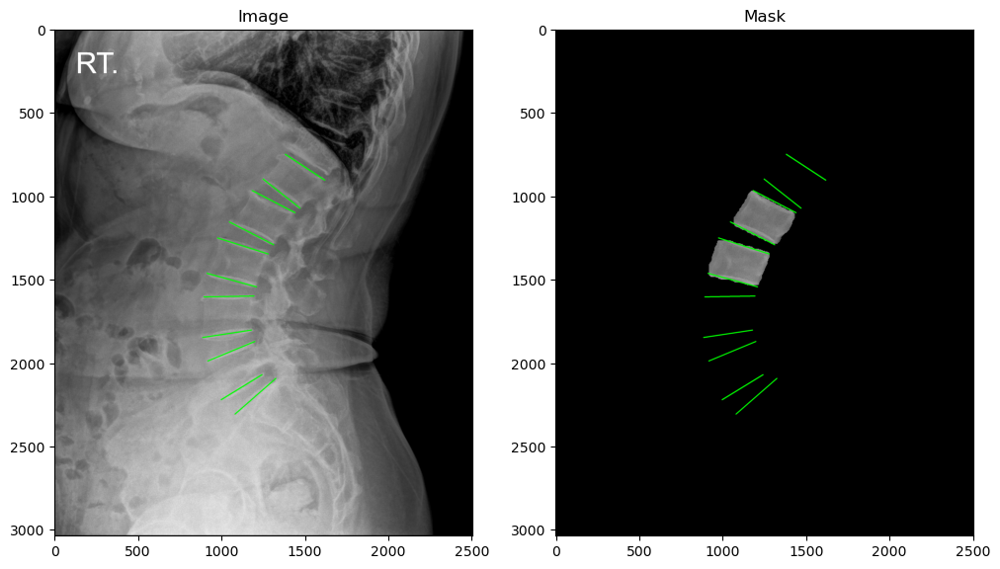


image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/train/LA/28_LA.jpg: 736x384 5 Ls, 15.8ms
Speed: 2.6ms preprocess, 15.8ms inference, 2.9ms postprocess per image at shape (1, 3, 736, 736)


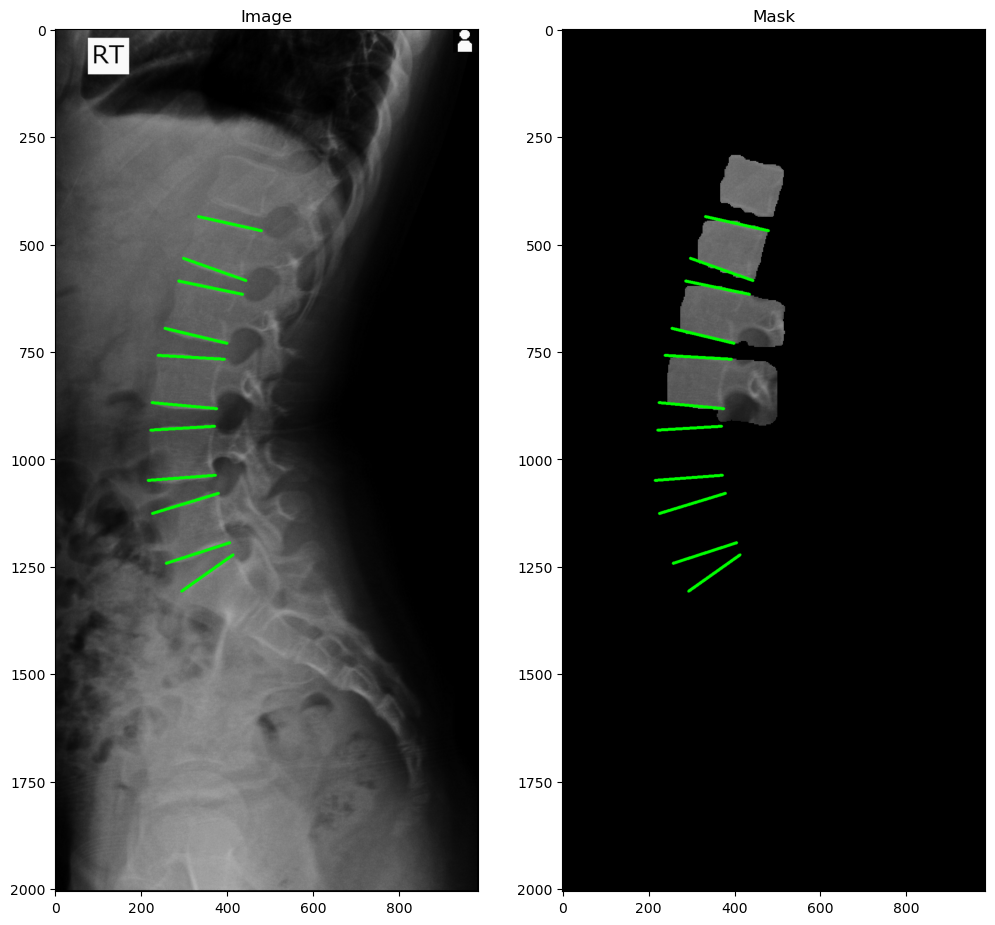


image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/train/LA/163_LA.jpg: 736x512 3 Ls, 18.6ms
Speed: 3.2ms preprocess, 18.6ms inference, 2.8ms postprocess per image at shape (1, 3, 736, 736)


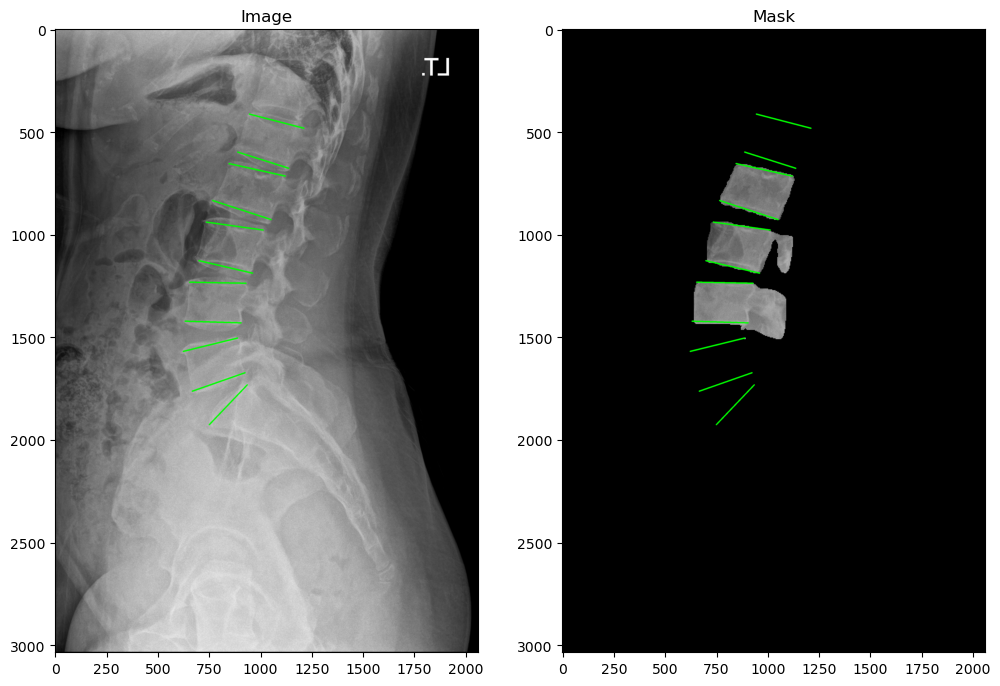


image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/train/LA/60_LA.jpg: 736x448 1 L, 17.8ms
Speed: 2.7ms preprocess, 17.8ms inference, 2.8ms postprocess per image at shape (1, 3, 736, 736)


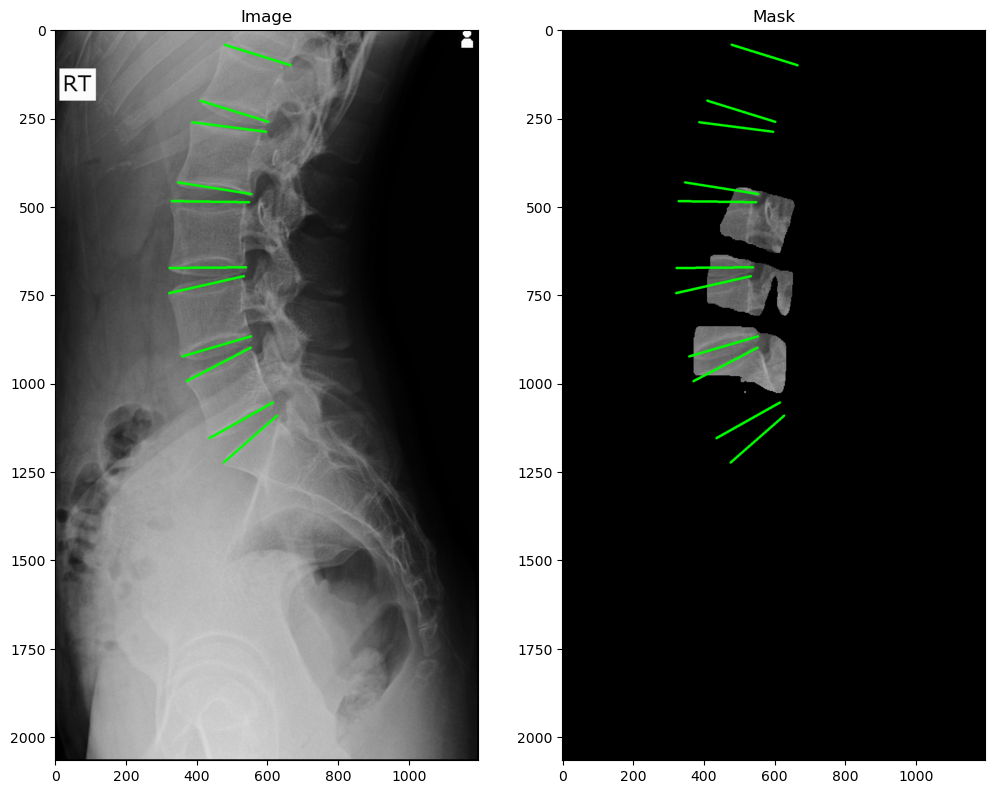


image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/train/LA/183_LA.jpg: 736x544 (no detections), 19.6ms
Speed: 3.5ms preprocess, 19.6ms inference, 0.4ms postprocess per image at shape (1, 3, 736, 736)

image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/train/LA/315_LA.jpg: 736x544 1 L, 18.7ms
Speed: 3.4ms preprocess, 18.7ms inference, 2.9ms postprocess per image at shape (1, 3, 736, 736)


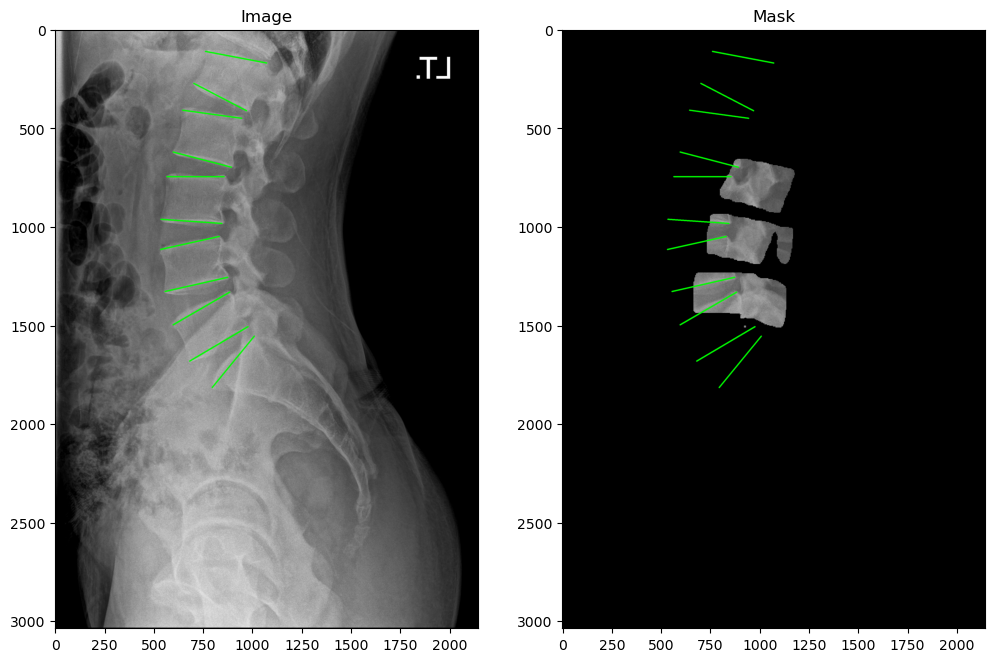


image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/train/LA/200_LA.jpg: 736x544 3 Ls, 18.7ms
Speed: 4.1ms preprocess, 18.7ms inference, 2.9ms postprocess per image at shape (1, 3, 736, 736)


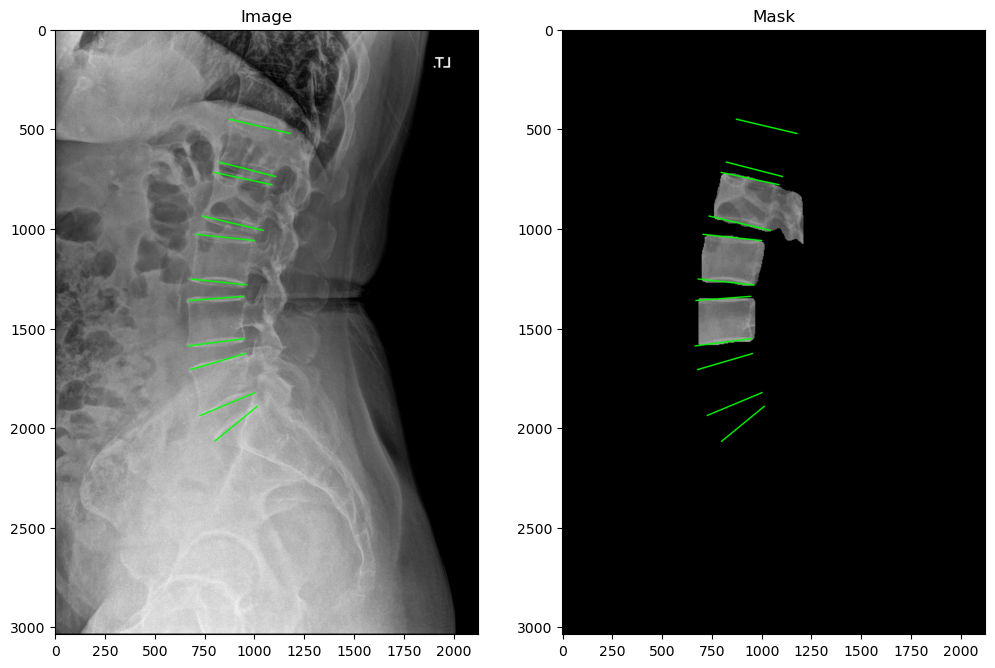


image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/train/LA/272_LA.jpg: 736x480 4 Ls, 18.3ms
Speed: 3.3ms preprocess, 18.3ms inference, 2.9ms postprocess per image at shape (1, 3, 736, 736)


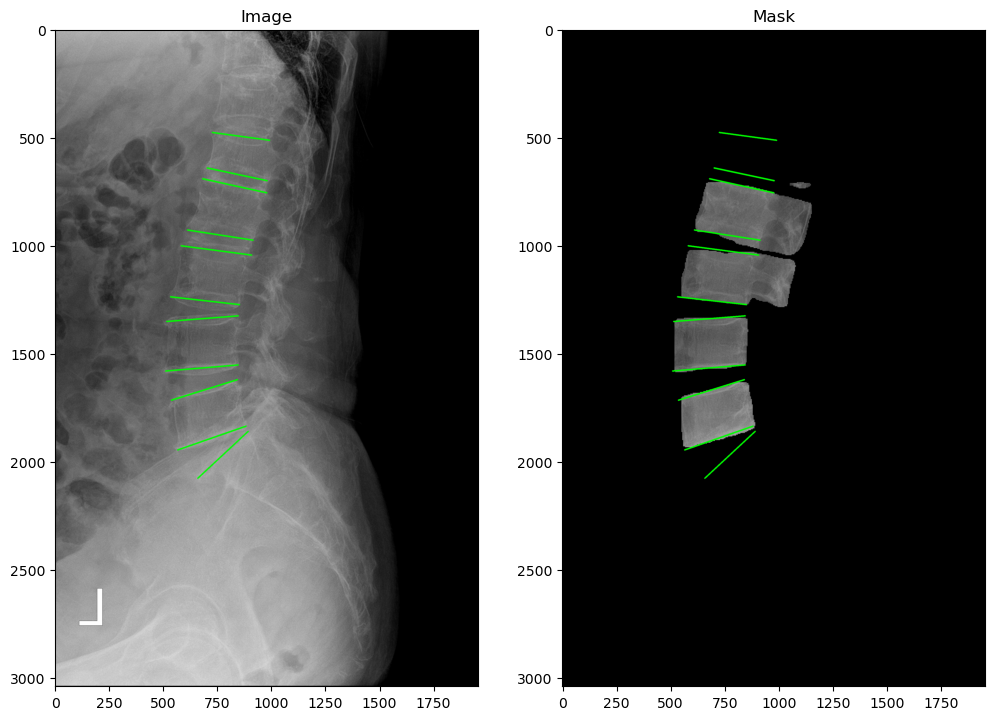


image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/train/LA/237_LA.jpg: 736x544 2 Ls, 19.7ms
Speed: 3.5ms preprocess, 19.7ms inference, 2.8ms postprocess per image at shape (1, 3, 736, 736)


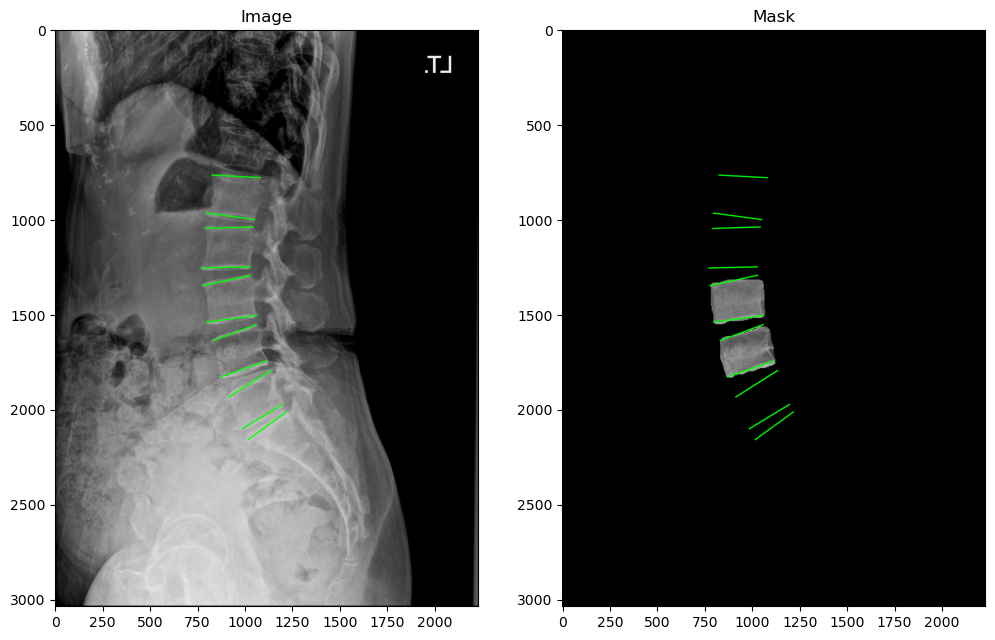

In [58]:
import random



for zz in range(12) :

    
    file = random.choice(LAPfiles)
     
    resutls      = model.predict(file, conf=0.5,device= '0')
    

    if resutls[0].masks == None :
       continue;

    All_masking  = resutls[0].masks.data.cpu().numpy()     
 
    D       = ReadAllBox_csv(file)

    
    # Load the image and mask
    img     = cv2.imread(file) 
    ximg    = img.copy()
   
    for i in range(6) :
      img = draw_box(img, D[i] , (0,255,0), 5)

    
  
    plt.figure(figsize=(12, 12))
    # Plot the image
    plt.subplot(121)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Image')

  
   
    
    for k in range(1,len(All_masking),1) :
      
        if k == 1 : 
          masking = cv2.bitwise_or(All_masking[k],All_masking[k-1])
        else :    
          masking = cv2.bitwise_or(All_masking[k],masking)
            
    masking = cv2.resize(masking, (img.shape[1],img.shape[0]  ))
    masking =  (masking*255).astype(np.uint8)    
    ximg    = cv2.bitwise_and(ximg, ximg , mask=masking)
        
    for i in range(6) :
      ximg = draw_box(ximg, D[i] , (0,255,0), 5)
    
    # Plot the mask
    plt.subplot(122)
    plt.imshow(ximg, cmap='gray')
    plt.title('Mask')
    plt.show()



In [21]:
df_sub =  pd.read_csv('outputz.csv')

df_sub

,id,L1a_1c,L1a_1r,L1a_2c,L1a_2r,L1b_1c,L1b_1r,L1b_2c,L1b_2r,L2a_1c,...,L5b_1c,L5b_1r,L5b_2c,L5b_2r,S1a_1c,S1a_1r,S1a_2c,S1a_2r,Label,Source_path
0,400.jpg,0.480183,0.172905,0.635919,0.172553,0.479318,0.237568,0.638514,0.236865,0.480183,...,0.449469,0.611492,0.645003,0.609383,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/400.jpg
1,401.jpg,0.411092,0.231355,0.574599,0.235011,0.409889,0.277942,0.582629,0.281381,0.410163,...,0.389754,0.595456,0.591272,0.596045,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/401.jpg
2,402.jpg,0.396312,0.204580,0.574163,0.202023,0.390244,0.261408,0.581631,0.257145,0.393512,...,0.404479,0.596111,0.623925,0.597828,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/402.jpg
3,403.jpg,0.531402,0.103261,0.400834,0.103261,0.531402,0.161685,0.400834,0.161685,0.538014,...,0.577013,0.502314,0.401246,0.514231,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/403.jpg
4,404.jpg,0.592863,0.184783,0.446936,0.184783,0.592863,0.243207,0.446936,0.243207,0.600254,...,0.628871,0.588315,0.439355,0.588315,0.0,0.0,0.0,0.0,AP,./BUU-LSPINE (Vertebral position)/test/404.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,595.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/595.jpg
196,596.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/596.jpg
197,597.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/597.jpg
198,598.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LA,./BUU-LSPINE (Vertebral position)/test/598.jpg


In [22]:


def Contour_To_Array(contour) :

    rect = cv2.minAreaRect(contour)
    box = cv2.boxPoints(rect)
    angle = rect[2]  # Angle in degrees
    sorted_box = sorted(box, key=lambda point: point[1])
    if sorted_box[0][0] > sorted_box[1][0]:
        top_right, top_left = sorted_box[0], sorted_box[1]
    else:
        top_left, top_right = sorted_box[0], sorted_box[1]
    
    if sorted_box[2][0] > sorted_box[3][0]:
        bottom_right, bottom_left = sorted_box[2], sorted_box[3]
    else:
        bottom_left, bottom_right = sorted_box[2], sorted_box[3]

    return top_right.tolist()+top_left.tolist()+bottom_right.tolist()+bottom_left.tolist

[0, 0, 0, 0, 0, 0, 0, 0]

In [48]:
from tqdm import tqdm 

dfx = df_sub.copy()

for index, row in tqdm(df_sub.iterrows()):
    
    
     if row['Label'] == "LA" :
           file = row['Source_path']
           resutls       = model.predict(file, conf=0.5,device= '0')
           List_contour  = resutls[0].masks.xyn
           D             = []

           diff = 5- len(List_contour)

           if diff > 0 :
               for contour in List_contour :
                   print(contour)
                   d = Contour_To_Array(contour)
                   D.append(d)
               for s in range(diff) :
                   D.append(8*[0.0])

           else : 
               for contour in List_contour :
                   d = Contour_To_Array(contour)
                   D.append(d)

           break
         
         
         # dfx.iloc[index,-6:-2]= 0.0
         # file = row['Source_path']
         # resutls       = model.predict(file, conf=0.5,device= '0')
         # List_contour  = resutls[0].masks.xyn
         # D             = []
         # for contour in List_contour :
         #   d = Contour_To_Array(contour)
         #   D.append(d)

         # D = sorted(D, key=lambda point: point[1])  
         # Z = []
         # for d in D :
         #    Z+=d
             
         # #print(len(Z))
         # dfx.iloc[index,1: min(40,len(Z))+1] = Z[0: min(40,len(Z))  ]    
        

0it [00:00, ?it/s]
image 1/1 /home/ubuntu/zz/BUU-LSPINE (Vertebral position)/test/500.jpg: 736x608 2 Ls, 20.3ms
Speed: 4.1ms preprocess, 20.3ms inference, 2.9ms postprocess per image at shape (1, 3, 736, 736)
100it [00:00, 685.82it/s]

[[    0.51672     0.45652]
 [    0.51505     0.45788]
 [    0.51338     0.45788]
 [    0.51171     0.45924]
 [    0.51003     0.45924]
 [    0.50836      0.4606]
 [    0.50669      0.4606]
 [    0.50502     0.46196]
 [    0.50167     0.46196]
 [        0.5     0.46332]
 [    0.49666     0.46332]
 [    0.49498     0.46467]
 [    0.49164     0.46467]
 [    0.48997     0.46603]
 [    0.48662     0.46603]
 [    0.48495     0.46739]
 [    0.47659     0.46739]
 [    0.47491     0.46875]
 [     0.4699     0.46875]
 [    0.46655     0.47147]
 [    0.46153     0.47147]
 [    0.45986     0.47283]
 [     0.4515     0.47283]
 [    0.44983     0.47418]
 [    0.44648     0.47418]
 [    0.44481     0.47554]
 [    0.44314     0.47554]
 [    0.44146      0.4769]
 [    0.43645      0.4769]
 [    0.43477     0.47826]
 [    0.42139     0.47826]
 [    0.41972     0.47962]
 [    0.41638     0.47962]
 [     0.4147     0.48098]
 [    0.41303     0.48098]
 [    0.41136     0.48234]
 [    0.40969     0.48234]
 

TypeError: can only concatenate list (not "builtin_function_or_method") to list

In [35]:
List_contour

[array([[    0.51672,     0.45652],
        [    0.51505,     0.45788],
        [    0.51338,     0.45788],
        [    0.51171,     0.45924],
        [    0.51003,     0.45924],
        [    0.50836,      0.4606],
        [    0.50669,      0.4606],
        [    0.50502,     0.46196],
        [    0.50167,     0.46196],
        [        0.5,     0.46332],
        [    0.49666,     0.46332],
        [    0.49498,     0.46467],
        [    0.49164,     0.46467],
        [    0.48997,     0.46603],
        [    0.48662,     0.46603],
        [    0.48495,     0.46739],
        [    0.47659,     0.46739],
        [    0.47491,     0.46875],
        [     0.4699,     0.46875],
        [    0.46655,     0.47147],
        [    0.46153,     0.47147],
        [    0.45986,     0.47283],
        [     0.4515,     0.47283],
        [    0.44983,     0.47418],
        [    0.44648,     0.47418],
        [    0.44481,     0.47554],
        [    0.44314,     0.47554],
        [    0.44146,      0

# Clear 

In [ ]:

# if os.path.exists("datasets"):
#      shutil.rmtree("datasets")